# Object Detection với Faster R-CNN bằng PyTorch và Torchvision

Notebook này hướng dẫn **fine-tune Faster R-CNN ResNet50-FPN có sẵn trong
`torchvision`** trên tập dữ liệu nhỏ **Penn–Fudan Pedestrian**.

Toàn bộ kiến trúc Faster R-CNN đã được torchvision cài đặt sẵn. Chúng ta chỉ cần:

1. Chuẩn bị dữ liệu theo đúng định dạng.
2. Nạp model pretrained trên COCO.
3. Thay classification head cho lớp `pedestrian`.
4. Huấn luyện bằng transfer learning.
5. Đánh giá COCO-style mAP.
6. Lưu, nạp và chạy inference.

## Mục tiêu học tập

Sau notebook, người học có thể:

- Phân biệt image classification, localization, detection và segmentation.
- Giải thích bounding box, IoU, Precision, Recall, AP và mAP.
- Mô tả Backbone, FPN, RPN, ROI Align, ROI Head và NMS.
- Viết custom PyTorch `Dataset` cho object detection.
- Dùng `tv_tensors.BoundingBoxes` và transforms v2.
- Fine-tune model `fasterrcnn_resnet50_fpn`.
- Hiểu bốn thành phần loss của Faster R-CNN.
- Đánh giá bằng mAP@0.50:0.95, mAP@0.50 và Average Recall.
- Lưu và nạp `state_dict` đúng cách.

> Trong Google Colab, chọn **Runtime → Change runtime type → T4 GPU** trước
> khi chạy.

## Phần I. Lý thuyết Object Detection

### 1. Object Detection là gì?

Object detection thực hiện đồng thời:

- **Classification:** đối tượng thuộc lớp nào?
- **Localization:** đối tượng nằm ở đâu trong ảnh?

Đầu ra của detector là một tập:

$$
D=\{(b_i,c_i,s_i)\}_{i=1}^{N}
$$

trong đó:

- \(b_i\): bounding box.
- \(c_i\): class ID.
- \(s_i\): confidence score.
- \(N\): số detection được giữ lại.

### 2. So sánh các bài toán thị giác

| Bài toán | Đầu ra |
|---|---|
| Image classification | Một nhãn cho toàn ảnh |
| Object localization | Một nhãn và một bounding box |
| Object detection | Nhiều nhãn và nhiều bounding box |
| Semantic segmentation | Nhãn cho từng pixel |
| Instance segmentation | Mask riêng cho từng đối tượng |

Penn–Fudan cung cấp instance masks. Trong notebook này, masks chỉ được dùng để
suy ra bounding boxes; model được huấn luyện cho **object detection**, không
phải instance segmentation.

### 3. Biểu diễn Bounding Box

Torchvision Faster R-CNN dùng định dạng:

$$
[x_{\min},y_{\min},x_{\max},y_{\max}]
$$

Điều kiện hợp lệ:

$$
0 \le x_{\min} < x_{\max} \le W
$$

$$
0 \le y_{\min} < y_{\max} \le H
$$

Trong đó:

- \(W\): chiều rộng ảnh.
- \(H\): chiều cao ảnh.
- \(width=x_{\max}-x_{\min}\).
- \(height=y_{\max}-y_{\min}\).

Một số thư viện khác có thể dùng:

- `xywh`: $[x_{\min},y_{\min},width,height]$
- `cxcywh`: $[x_c,y_c,width,height]$

Sai định dạng box là một trong những nguyên nhân phổ biến làm loss không hội tụ.

### 4. Intersection over Union

IoU đo mức độ chồng lấp giữa predicted box \(B_p\) và ground-truth box \(B_g\):

$$
IoU(B_p,B_g)=
\frac{|B_p\cap B_g|}
{|B_p\cup B_g|}
$$

- IoU = 0: hai box không giao nhau.
- IoU = 1: hai box trùng hoàn toàn.
- IoU ≥ 0.50 thường được xem là matching trong AP50.
- Faster R-CNN còn dùng IoU để gán anchor và proposal thành positive, negative
  hoặc ignored.

### 5. Precision, Recall, AP và mAP

$$
Precision=\frac{TP}{TP+FP}
$$

$$
Recall=\frac{TP}{TP+FN}
$$

Trong object detection:

- **True Positive:** box đúng lớp, đủ IoU và ground truth chưa được ghép.
- **False Positive:** box sai, box trùng hoặc box không đủ IoU.
- **False Negative:** ground-truth object bị bỏ sót.

**Average Precision (AP)** tóm tắt đường Precision–Recall.

Các chỉ số COCO thường dùng:

| Chỉ số | Ý nghĩa |
|---|---|
| `mAP` | Trung bình AP tại IoU 0.50, 0.55, ..., 0.95 |
| `mAP_50` | AP tại IoU 0.50 |
| `mAP_75` | AP tại IoU 0.75 |
| `mAP_small` | AP cho vật thể nhỏ |
| `mAP_medium` | AP cho vật thể vừa |
| `mAP_large` | AP cho vật thể lớn |
| `mAR_100` | Average Recall với tối đa 100 detections mỗi ảnh |

Dataset chỉ có một foreground class nên việc trung bình theo lớp chỉ gồm
`pedestrian`.

## Phần II. Faster R-CNN

### 1. Two-stage detector

Faster R-CNN là detector hai giai đoạn:

```text
Image
  │
  ▼
ResNet50 backbone
  │
  ▼
Feature Pyramid Network
  │
  ▼
Region Proposal Network
  │
  ▼
Region proposals
  │
  ▼
Multi-scale ROI Align
  │
  ▼
ROI classification + box regression
  │
  ▼
Non-Maximum Suppression
  │
  ▼
Final detections
```

So với one-stage detector như YOLO:

| Đặc điểm | Faster R-CNN | YOLO |
|---|---|---|
| Kiến trúc | Hai giai đoạn | Một giai đoạn |
| Tốc độ | Thường chậm hơn | Thường nhanh hơn |
| Proposal stage | Có | Không |
| Pipeline | Phức tạp hơn | Gọn hơn |
| Mục tiêu phổ biến | Độ chính xác, nghiên cứu | Realtime, deployment |

### 2. Backbone ResNet50

Backbone biến ảnh thành feature maps.

ResNet50 sử dụng residual connections:

\[
y=F(x)+x
\]

Kết nối tắt giúp gradient truyền qua mạng sâu ổn định hơn.

Notebook nạp weights pretrained COCO cho toàn bộ detector, bao gồm backbone,
FPN, RPN và ROI heads. Classification head cuối cùng được thay bằng head mới
cho hai class:

- Class 0: background.
- Class 1: pedestrian.

### 3. Feature Pyramid Network

FPN kết hợp feature maps ở nhiều độ phân giải.

- Feature map có độ phân giải cao hỗ trợ vật thể nhỏ.
- Feature map sâu hơn có ngữ nghĩa mạnh, hỗ trợ vật thể lớn.
- RPN và ROI Align hoạt động trên nhiều mức pyramid.

Điều này tốt hơn việc chỉ sử dụng một feature map duy nhất cho mọi kích thước
đối tượng.

### 4. Anchors và Region Proposal Network

Tại mỗi vị trí feature map, RPN xét nhiều anchor có scale và aspect ratio khác
nhau.

RPN dự đoán cho mỗi anchor:

1. **Objectness:** anchor có chứa object hay không.
2. **Box offsets:** anchor cần dịch chuyển và thay đổi kích thước thế nào.

Anchor thường được gán:

- Positive nếu IoU với ground truth đủ lớn.
- Negative nếu IoU thấp.
- Ignored nếu nằm giữa hai ngưỡng.

Torchvision thực hiện toàn bộ anchor matching, sampling, loss và proposal
generation bên trong model.

### 5. ROI Align và ROI Head

Proposal có kích thước khác nhau. ROI Align lấy đặc trưng từ FPN và chuyển mỗi
proposal thành tensor có kích thước cố định.

ROI Head dự đoán:

- Background hoặc pedestrian.
- Bốn box offsets để tinh chỉnh proposal.

Với một foreground class:

```python
NUM_CLASSES = 2
```

vì Faster R-CNN luôn tính cả background.

### 6. Non-Maximum Suppression

NMS loại các detection trùng nhau:

1. Chọn box có score cao nhất.
2. Loại box còn lại có IoU vượt ngưỡng.
3. Lặp lại cho đến khi hết box hoặc đạt số detection tối đa.

- NMS threshold thấp: loại box trùng mạnh, nhưng có thể xóa hai người đứng gần.
- NMS threshold cao: tăng recall, nhưng có thể giữ nhiều duplicate boxes.

### 7. Loss của Faster R-CNN

Khi model ở `train()` và nhận cả images lẫn targets, torchvision trả về:

```python
{
    "loss_classifier": ...,
    "loss_box_reg": ...,
    "loss_objectness": ...,
    "loss_rpn_box_reg": ...,
}
```

Tổng loss:

\[
L=
L_{classifier}
+L_{box}
+L_{objectness}
+L_{rpn\_box}
\]

| Loss | Vai trò |
|---|---|
| `loss_objectness` | RPN phân biệt object/background |
| `loss_rpn_box_reg` | RPN điều chỉnh positive anchors |
| `loss_classifier` | ROI Head phân loại proposal |
| `loss_box_reg` | ROI Head tinh chỉnh foreground proposal |

Trong `eval()` và chỉ truyền images, model trả về predictions thay vì loss.

## Phần III. Cài đặt môi trường

Colab thường đã có PyTorch và torchvision tương thích. Chỉ cài thêm:

- `torchmetrics`: COCO-style mAP.
- `pycocotools`: backend đánh giá detection.

Không cài lại `torch` và `torchvision` để tránh tạo xung đột CUDA.

In [13]:
%pip install -q -U torchmetrics pycocotools

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.4/983.4 kB 27.6 MB/s eta 0:00:00


## 1. Import thư viện và kiểm tra phiên bản

In [14]:
import io
import os
import json
import math
import time
import random
import urllib.request
import zipfile
from pathlib import Path
from collections import defaultdict

import numpy as np
import matplotlib.pyplot as plt
from PIL import Image as PILImage

import torch
import torchvision
from torch import nn
from torch.utils.data import Dataset, DataLoader, Subset

from torchvision import tv_tensors
from torchvision.io import read_image
from torchvision.ops import masks_to_boxes, box_iou
from torchvision.transforms import v2 as T
from torchvision.transforms import functional as TF
from torchvision.models.detection import (
    fasterrcnn_resnet50_fpn,
    FasterRCNN_ResNet50_FPN_Weights,
)
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.utils import draw_bounding_boxes

from torchmetrics.detection.mean_ap import MeanAveragePrecision
from tqdm.auto import tqdm

print("PyTorch:", torch.__version__)
print("Torchvision:", torchvision.__version__)

DEVICE = torch.device(
    "cuda"
    if torch.cuda.is_available()
    else "cpu"
)

print("Device:", DEVICE)

if DEVICE.type == "cuda":
    print("GPU:", torch.cuda.get_device_name(0))
    print(
        "GPU memory:",
        round(
            torch.cuda.get_device_properties(0).total_memory / 1024**3,
            2,
        ),
        "GB",
    )

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)

PyTorch: 2.11.0+cu128
Torchvision: 0.26.0+cu128
Device: cuda
GPU: Tesla T4
GPU memory: 14.56 GB


## 2. Siêu tham số

| Tham số | Giá trị | Ý nghĩa |
|---|---:|---|
| `NUM_CLASSES` | 2 | Background + pedestrian |
| `BATCH_SIZE` | 2 | Số ảnh mỗi optimizer step |
| `NUM_WORKERS` | 2 | Số worker đọc dữ liệu |
| `EPOCHS` | 5 | Số lần đi qua tập train |
| `LEARNING_RATE` | 0.005 | Learning rate ban đầu cho SGD |
| `MOMENTUM` | 0.9 | Làm mượt hướng cập nhật |
| `WEIGHT_DECAY` | 0.0005 | L2 regularization |
| `TRAINABLE_BACKBONE_LAYERS` | 3 | Số block cuối backbone được fine-tune |
| `MIN_SIZE` | 512 | Cạnh ngắn sau resize nội bộ |
| `MAX_SIZE` | 768 | Cạnh dài tối đa |
| `SCORE_THRESHOLD` | 0.05 | Ngưỡng giữ prediction trong model |
| `NMS_THRESHOLD` | 0.5 | Final NMS IoU threshold |

### Lưu ý về batch size

Detection model nhận một **list ảnh**, không phải một tensor batch cố định. Các
ảnh trong cùng batch có thể khác kích thước.

Nếu T4 báo out-of-memory:

```python
BATCH_SIZE = 1
```

In [2]:
NUM_CLASSES = 2

BATCH_SIZE = 2
NUM_WORKERS = 2
EPOCHS = 5

LEARNING_RATE = 0.005
MOMENTUM = 0.9
WEIGHT_DECAY = 0.0005

TRAINABLE_BACKBONE_LAYERS = 3

MIN_SIZE = 512
MAX_SIZE = 768

SCORE_THRESHOLD = 0.05
NMS_THRESHOLD = 0.50
MAX_DETECTIONS_PER_IMAGE = 100

DATA_ROOT = Path("/content/PennFudanPed")
OUTPUT_DIR = Path("/content/faster_rcnn_pytorch")

OUTPUT_DIR.mkdir(
    parents=True,
    exist_ok=True,
)

BEST_WEIGHTS_PATH = (
    OUTPUT_DIR / "faster_rcnn_penn_fudan_best.pth"
)

HISTORY_PATH = OUTPUT_DIR / "training_history.json"

## Phần IV. Dataset Penn–Fudan

Penn–Fudan gồm:

- 170 ảnh.
- 345 pedestrian instances.
- Một instance mask cho mỗi ảnh.
- Một hoặc nhiều người trong mỗi ảnh.
- Một foreground class: pedestrian.

Dataset nhỏ phù hợp cho tutorial và transfer learning, nhưng không đủ để đánh
giá khả năng triển khai trong môi trường thực tế đa dạng.

## 3. Tải và giải nén dữ liệu

In [3]:
DATA_URL = (
    "https://www.cis.upenn.edu/~jshi/"
    "ped_html/PennFudanPed.zip"
)

ZIP_PATH = Path("/content/PennFudanPed.zip")

if not DATA_ROOT.exists():
    print("Đang tải Penn–Fudan...")

    urllib.request.urlretrieve(
        DATA_URL,
        ZIP_PATH,
    )

    with zipfile.ZipFile(
        ZIP_PATH,
        "r",
    ) as zip_file:
        zip_file.extractall("/content")

image_paths = sorted(
    (DATA_ROOT / "PNGImages").glob("*.png")
)

mask_paths = sorted(
    (DATA_ROOT / "PedMasks").glob("*.png")
)

print("Số ảnh:", len(image_paths))
print("Số mask:", len(mask_paths))

assert len(image_paths) == 170
assert len(mask_paths) == 170

Đang tải Penn–Fudan...
Số ảnh: 170
Số mask: 170


## 4. Quan sát ảnh và instance mask

Trong mask:

- 0 là background.
- Mỗi số nguyên khác 0 là một pedestrian instance riêng.
- Các màu khi hiển thị chỉ giúp phân biệt ID; model không sử dụng màu mask.

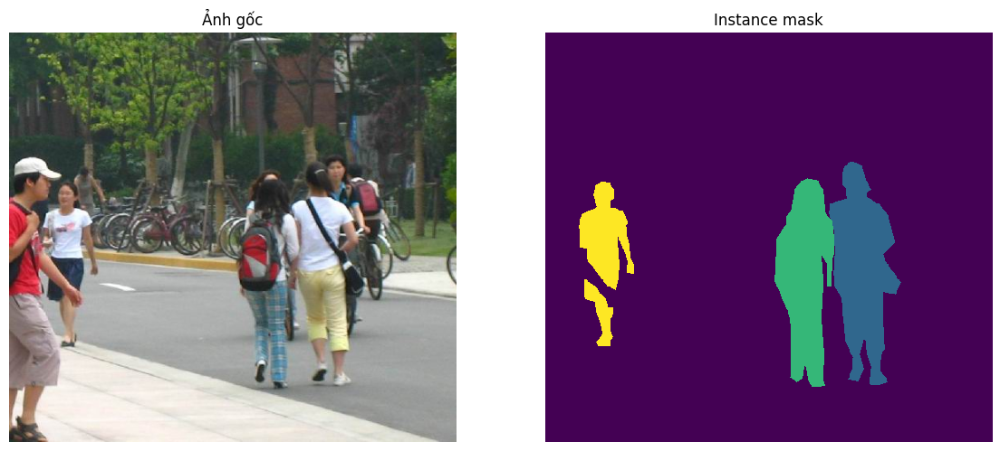

Image shape: (3, 507, 552)
Mask shape: (1, 507, 552)
Instance IDs: [0, 1, 2, 3]


In [4]:
example_index = 40

example_image = read_image(
    str(image_paths[example_index])
)

example_mask = read_image(
    str(mask_paths[example_index])
)

plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.imshow(
    example_image.permute(1, 2, 0)
)
plt.title("Ảnh gốc")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(
    example_mask.squeeze(0),
    interpolation="nearest",
)
plt.title("Instance mask")
plt.axis("off")

plt.show()

print("Image shape:", tuple(example_image.shape))
print("Mask shape:", tuple(example_mask.shape))
print(
    "Instance IDs:",
    torch.unique(example_mask).tolist(),
)

## 5. Custom Dataset cho Object Detection

Torchvision yêu cầu `__getitem__()` trả về:

```python
image, target
```

### Image

- Tensor `[C, H, W]`.
- Khi đưa vào model: kiểu float và khoảng giá trị `[0, 1]`.

### Target dictionary

| Key | Kiểu và shape | Ý nghĩa |
|---|---|---|
| `boxes` | FloatTensor `[N,4]` | `[xmin,ymin,xmax,ymax]` |
| `labels` | Int64Tensor `[N]` | Class của mỗi box |
| `image_id` | Int64Tensor `[1]` | ID duy nhất |
| `area` | FloatTensor `[N]` | Diện tích box |
| `iscrowd` | UInt8Tensor `[N]` | Object crowd hay không |

Class ID 0 luôn dành cho background. Vì vậy mọi pedestrian có label 1.

In [5]:
class PennFudanDetectionDataset(Dataset):
    def __init__(
        self,
        root,
        transforms=None,
    ):
        self.root = Path(root)
        self.transforms = transforms

        self.images = sorted(
            (self.root / "PNGImages").glob("*.png")
        )

        masks = sorted(
            (self.root / "PedMasks").glob("*.png")
        )

        self.mask_by_stem = {
            mask_path.stem.replace("_mask", ""): mask_path
            for mask_path in masks
        }

        assert len(self.images) == len(self.mask_by_stem)

    def __len__(self):
        return len(self.images)

    def get_height_and_width(self, index):
        image = read_image(
            str(self.images[index])
        )

        _, height, width = image.shape
        return height, width

    def __getitem__(self, index):
        image_path = self.images[index]
        mask_path = self.mask_by_stem[
            image_path.stem
        ]

        image = read_image(
            str(image_path)
        )

        mask = read_image(
            str(mask_path)
        ).squeeze(0)

        object_ids = torch.unique(mask)
        object_ids = object_ids[
            object_ids != 0
        ]

        instance_masks = (
            mask == object_ids[:, None, None]
        ).to(torch.uint8)

        boxes = masks_to_boxes(
            instance_masks
        )

        valid = (
            (boxes[:, 2] > boxes[:, 0])
            & (boxes[:, 3] > boxes[:, 1])
        )

        boxes = boxes[valid]

        number_of_objects = boxes.shape[0]

        labels = torch.ones(
            number_of_objects,
            dtype=torch.int64,
        )

        area = (
            (boxes[:, 2] - boxes[:, 0])
            * (boxes[:, 3] - boxes[:, 1])
        )

        iscrowd = torch.zeros(
            number_of_objects,
            dtype=torch.uint8,
        )

        image = tv_tensors.Image(image)

        boxes = tv_tensors.BoundingBoxes(
            boxes,
            format="XYXY",
            canvas_size=(
                image.shape[-2],
                image.shape[-1],
            ),
        )

        target = {
            "boxes": boxes,
            "labels": labels,
            "image_id": torch.tensor(
                [index],
                dtype=torch.int64,
            ),
            "area": area,
            "iscrowd": iscrowd,
        }

        if self.transforms is not None:
            image, target = self.transforms(
                image,
                target,
            )

        return image, target

## 6. Transforms v2

Object detection augmentation phải biến đổi đồng thời:

- Ảnh.
- Bounding boxes.
- Nhãn liên quan nếu box bị loại.

`tv_tensors.BoundingBoxes` chứa cả định dạng box và kích thước canvas nên
`RandomHorizontalFlip` có thể tự cập nhật box.

Pipeline:

1. Lật ngang với xác suất 0.5 cho train.
2. Chuyển ảnh từ `uint8 [0,255]` thành `float32 [0,1]`.
3. Chuyển TVTensor về tensor thường trước DataLoader/model.

Không resize trong Dataset vì Faster R-CNN có `GeneralizedRCNNTransform` nội bộ
để resize, normalize và batch ảnh.

In [6]:
def get_transforms(training):
    transforms = []

    if training:
        transforms.append(
            T.RandomHorizontalFlip(p=0.5)
        )

    transforms.extend(
        [
            T.ToDtype(
                torch.float32,
                scale=True,
            ),
            T.ToPureTensor(),
        ]
    )

    return T.Compose(transforms)

## 7. Kiểm tra output của Dataset

In [7]:
debug_dataset = PennFudanDetectionDataset(
    DATA_ROOT,
    transforms=get_transforms(
        training=False
    ),
)

debug_image, debug_target = debug_dataset[0]

print("Image dtype:", debug_image.dtype)
print("Image shape:", tuple(debug_image.shape))
print(
    "Image range:",
    float(debug_image.min()),
    float(debug_image.max()),
)

for key, value in debug_target.items():
    if torch.is_tensor(value):
        print(
            f"{key:10s}",
            tuple(value.shape),
            value.dtype,
        )
    else:
        print(key, type(value))

print("\nBoxes:")
print(debug_target["boxes"])
print("\nLabels:")
print(debug_target["labels"])

Image dtype: torch.float32
Image shape: (3, 536, 559)
Image range: 0.0 1.0
boxes      (2, 4) torch.float32
labels     (2,) torch.int64
image_id   (1,) torch.int64
area       (2,) torch.float32
iscrowd    (2,) torch.uint8

Boxes:
tensor([[159., 181., 301., 430.],
        [419., 170., 534., 485.]])

Labels:
tensor([1, 1])


## 8. Trực quan hóa bounding boxes

`draw_bounding_boxes()` cần ảnh `uint8`, vì vậy ảnh float `[0,1]` được đổi lại
thành `[0,255]`.

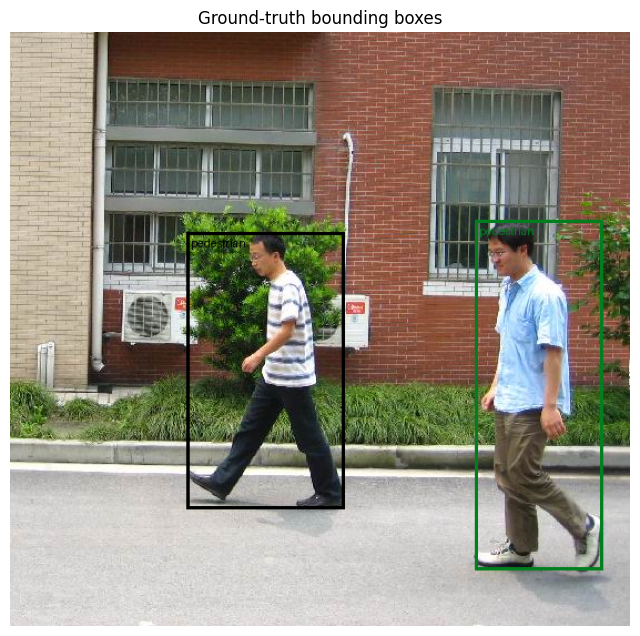

In [8]:
def image_to_uint8(image):
    if image.dtype == torch.uint8:
        return image

    return (
        image.clamp(0, 1) * 255
    ).to(torch.uint8)


def visualize_target(
    image,
    target,
    title=None,
):
    image_uint8 = image_to_uint8(image)

    labels = [
        "pedestrian"
        for _ in range(
            len(target["boxes"])
        )
    ]

    drawn = draw_bounding_boxes(
        image_uint8,
        boxes=target["boxes"],
        labels=labels,
        width=3,
    )

    plt.figure(figsize=(8, 8))
    plt.imshow(
        drawn.permute(1, 2, 0)
    )
    plt.axis("off")

    if title:
        plt.title(title)

    plt.show()


visualize_target(
    debug_image,
    debug_target,
    title="Ground-truth bounding boxes",
)

## 9. Thống kê dữ liệu

Các thống kê hữu ích:

- Số object mỗi ảnh.
- Diện tích box.
- Aspect ratio \(height/width\).
- Tỷ lệ object nhỏ so với ảnh.

Chúng giúp lựa chọn image size, anchor configuration và augmentation.

In [9]:
statistics_dataset = PennFudanDetectionDataset(
    DATA_ROOT,
    transforms=None,
)

object_counts = []
box_widths = []
box_heights = []
box_areas = []
aspect_ratios = []

for index in range(
    len(statistics_dataset)
):
    _, target = statistics_dataset[index]

    boxes = target["boxes"].as_subclass(
        torch.Tensor
    )

    widths = boxes[:, 2] - boxes[:, 0]
    heights = boxes[:, 3] - boxes[:, 1]

    object_counts.append(
        len(boxes)
    )

    box_widths.extend(
        widths.tolist()
    )
    box_heights.extend(
        heights.tolist()
    )
    box_areas.extend(
        (widths * heights).tolist()
    )
    aspect_ratios.extend(
        (heights / widths).tolist()
    )

print("Tổng ảnh:", len(statistics_dataset))
print("Tổng objects:", sum(object_counts))
print(
    "Objects trung bình/ảnh:",
    np.mean(object_counts),
)
print(
    "Box width trung vị:",
    np.median(box_widths),
)
print(
    "Box height trung vị:",
    np.median(box_heights),
)
print(
    "Aspect ratio trung vị:",
    np.median(aspect_ratios),
)

Tổng ảnh: 170
Tổng objects: 423
Objects trung bình/ảnh: 2.488235294117647
Box width trung vị: 100.0
Box height trung vị: 285.0
Aspect ratio trung vị: 2.7545454502105713


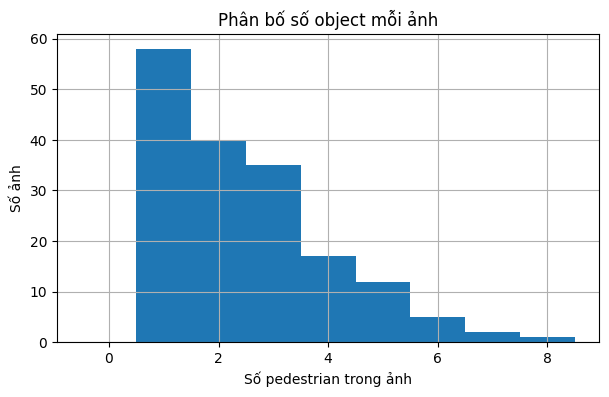

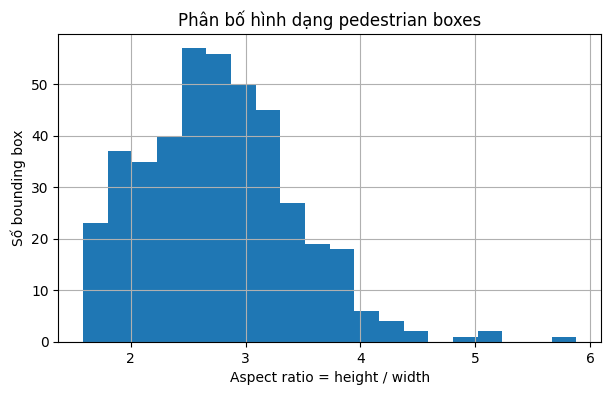

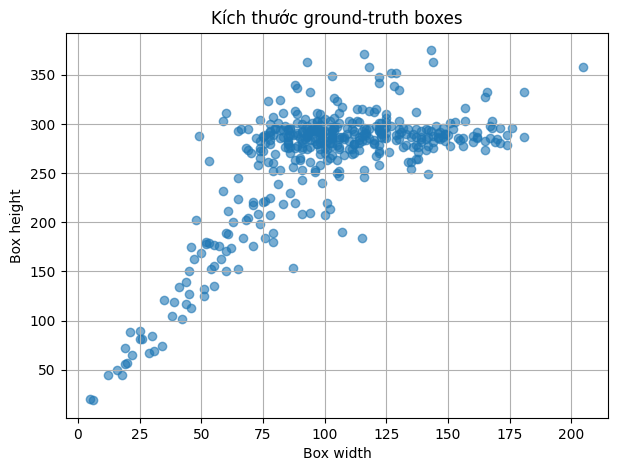

In [10]:
plt.figure(figsize=(7, 4))
plt.hist(
    object_counts,
    bins=np.arange(max(object_counts) + 2) - 0.5,
)
plt.xlabel("Số pedestrian trong ảnh")
plt.ylabel("Số ảnh")
plt.title("Phân bố số object mỗi ảnh")
plt.grid(True)
plt.show()

plt.figure(figsize=(7, 4))
plt.hist(
    aspect_ratios,
    bins=20,
)
plt.xlabel("Aspect ratio = height / width")
plt.ylabel("Số bounding box")
plt.title("Phân bố hình dạng pedestrian boxes")
plt.grid(True)
plt.show()

plt.figure(figsize=(7, 5))
plt.scatter(
    box_widths,
    box_heights,
    alpha=0.6,
)
plt.xlabel("Box width")
plt.ylabel("Box height")
plt.title("Kích thước ground-truth boxes")
plt.grid(True)
plt.show()

## 10. Chia train và validation

Split 80/20 với random seed cố định:

- Train: 136 ảnh.
- Validation: 34 ảnh.

Hai `Dataset` riêng được tạo để train có augmentation còn validation không có
random flip. Cả hai dùng cùng danh sách index.

In [15]:

generator = torch.Generator()
generator.manual_seed(SEED)

all_indices = torch.randperm(
    len(debug_dataset),
    generator=generator,
).tolist()

split_index = int(
    0.8 * len(all_indices)
)

train_indices = all_indices[:split_index]
validation_indices = all_indices[split_index:]

train_full_dataset = (
    PennFudanDetectionDataset(
        DATA_ROOT,
        transforms=get_transforms(
            training=True
        ),
    )
)

validation_full_dataset = (
    PennFudanDetectionDataset(
        DATA_ROOT,
        transforms=get_transforms(
            training=False
        ),
    )
)

train_dataset = Subset(
    train_full_dataset,
    train_indices,
)

validation_dataset = Subset(
    validation_full_dataset,
    validation_indices,
)

print("Train images:", len(train_dataset))
print(
    "Validation images:",
    len(validation_dataset),
)

Train images: 136
Validation images: 34


## 11. DataLoader và `collate_fn`

Mỗi ảnh có kích thước và số box khác nhau nên không thể dùng phép stack mặc
định.

`collate_fn` trả về:

```python
tuple(images), tuple(targets)
```

Model sẽ tự xử lý danh sách ảnh.

In [16]:
def detection_collate_fn(batch):
    return tuple(zip(*batch))


pin_memory = DEVICE.type == "cuda"

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    collate_fn=detection_collate_fn,
    pin_memory=pin_memory,
    persistent_workers=NUM_WORKERS > 0,
)

validation_loader = DataLoader(
    validation_dataset,
    batch_size=1,
    shuffle=False,
    num_workers=NUM_WORKERS,
    collate_fn=detection_collate_fn,
    pin_memory=pin_memory,
    persistent_workers=NUM_WORKERS > 0,
)

images, targets = next(
    iter(train_loader)
)

print("Số ảnh trong batch:", len(images))
print(
    "Shapes:",
    [tuple(image.shape) for image in images],
)
print(
    "Số boxes:",
    [len(target["boxes"]) for target in targets],
)

Số ảnh trong batch: 2
Shapes: [(3, 410, 530), (3, 422, 570)]
Số boxes: [2, 1]


## Phần V. Khởi tạo Faster R-CNN có sẵn

### Model được sử dụng

```python
torchvision.models.detection.fasterrcnn_resnet50_fpn
```

Model pretrained trên COCO có 91 output classes theo cấu trúc COCO. Ta thay
`FastRCNNPredictor` cuối cùng bằng predictor mới có hai class.

### `trainable_backbone_layers`

Giá trị hợp lệ từ 0 đến 5:

- 0: đóng băng toàn bộ backbone.
- 5: fine-tune toàn bộ backbone.
- 3: fine-tune ba block cuối; là lựa chọn cân bằng cho transfer learning.

### Resize nội bộ

Model nhận ảnh có kích thước khác nhau rồi:

1. Normalize bằng ImageNet mean/std.
2. Resize cạnh ngắn đến `MIN_SIZE`.
3. Giới hạn cạnh dài bởi `MAX_SIZE`.
4. Pad các ảnh trong batch để tạo `ImageList`.
5. Sau inference, ánh xạ boxes về kích thước ảnh đầu vào.

## 12. Hàm tạo model

In [17]:
def create_faster_rcnn_model(
    num_classes,
):
    weights = (
        FasterRCNN_ResNet50_FPN_Weights.DEFAULT
    )

    model = fasterrcnn_resnet50_fpn(
        weights=weights,
        trainable_backbone_layers=(
            TRAINABLE_BACKBONE_LAYERS
        ),
        min_size=MIN_SIZE,
        max_size=MAX_SIZE,
        rpn_pre_nms_top_n_train=1000,
        rpn_post_nms_top_n_train=500,
        rpn_pre_nms_top_n_test=500,
        rpn_post_nms_top_n_test=300,
        rpn_nms_thresh=0.7,
        rpn_fg_iou_thresh=0.7,
        rpn_bg_iou_thresh=0.3,
        rpn_batch_size_per_image=256,
        rpn_positive_fraction=0.5,
        box_score_thresh=SCORE_THRESHOLD,
        box_nms_thresh=NMS_THRESHOLD,
        box_detections_per_img=(
            MAX_DETECTIONS_PER_IMAGE
        ),
        box_fg_iou_thresh=0.5,
        box_bg_iou_thresh=0.5,
        box_batch_size_per_image=256,
        box_positive_fraction=0.25,
    )

    input_features = (
        model
        .roi_heads
        .box_predictor
        .cls_score
        .in_features
    )

    model.roi_heads.box_predictor = (
        FastRCNNPredictor(
            input_features,
            num_classes,
        )
    )

    return model


model = create_faster_rcnn_model(
    NUM_CLASSES
)

model = model.to(DEVICE)

print(
    "Model created on:",
    next(model.parameters()).device,
)

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


100%|██████████| 160M/160M [00:00<00:00, 175MB/s]


Model created on: cuda:0


## 13. Giải thích các tham số model

### RPN

| Tham số | Giá trị | Ý nghĩa |
|---|---:|---|
| `rpn_pre_nms_top_n_train` | 1000 | Candidates trước NMS khi train |
| `rpn_post_nms_top_n_train` | 500 | Proposals sau NMS khi train |
| `rpn_pre_nms_top_n_test` | 500 | Candidates trước NMS khi test |
| `rpn_post_nms_top_n_test` | 300 | Proposals sau NMS khi test |
| `rpn_nms_thresh` | 0.7 | RPN NMS threshold |
| `rpn_fg_iou_thresh` | 0.7 | Anchor positive nếu IoU ≥ 0.7 |
| `rpn_bg_iou_thresh` | 0.3 | Anchor negative nếu IoU < 0.3 |
| `rpn_batch_size_per_image` | 256 | Anchor samples mỗi ảnh |
| `rpn_positive_fraction` | 0.5 | Tối đa 50% positive anchors |

### ROI Head

| Tham số | Giá trị | Ý nghĩa |
|---|---:|---|
| `box_fg_iou_thresh` | 0.5 | Proposal foreground nếu IoU ≥ 0.5 |
| `box_bg_iou_thresh` | 0.5 | Proposal background nếu IoU < 0.5 |
| `box_batch_size_per_image` | 256 | ROI samples mỗi ảnh |
| `box_positive_fraction` | 0.25 | Tối đa 25% foreground ROIs |
| `box_score_thresh` | 0.05 | Loại detection score rất thấp |
| `box_nms_thresh` | 0.5 | Final NMS threshold |
| `box_detections_per_img` | 100 | Số detection tối đa |

Giảm proposal và ROI counts giúp Colab chạy nhẹ hơn, nhưng giá trị quá thấp có
thể làm giảm recall.

## 14. Kiểm tra kiến trúc và số tham số

In [18]:
total_parameters = sum(
    parameter.numel()
    for parameter in model.parameters()
)

trainable_parameters = sum(
    parameter.numel()
    for parameter in model.parameters()
    if parameter.requires_grad
)

print(
    "Total parameters:",
    f"{total_parameters:,}",
)

print(
    "Trainable parameters:",
    f"{trainable_parameters:,}",
)

print(
    "Frozen parameters:",
    f"{total_parameters - trainable_parameters:,}",
)

print("\nInternal image transform:")
print(model.transform)

print("\nRPN:")
print(type(model.rpn).__name__)

print("\nROI predictor:")
print(model.roi_heads.box_predictor)

Total parameters: 41,299,161
Trainable parameters: 41,076,761
Frozen parameters: 222,400

Internal image transform:
GeneralizedRCNNTransform(
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    Resize(min_size=(512,), max_size=768, mode='bilinear')
)

RPN:
RegionProposalNetwork

ROI predictor:
FastRCNNPredictor(
  (cls_score): Linear(in_features=1024, out_features=2, bias=True)
  (bbox_pred): Linear(in_features=1024, out_features=8, bias=True)
)


## 15. Sanity check một training forward pass

Trong training mode:

```python
loss_dict = model(images, targets)
```

Model phải trả bốn loss không âm và hữu hạn. Cell này giúp phát hiện sớm:

- Sai box format.
- Label 0 được dùng nhầm.
- Box ngoài ảnh.
- Ảnh chưa đổi sang float `[0,1]`.
- Target thiếu key bắt buộc.

In [19]:
def move_target_to_device(
    target,
    device,
):
    return {
        key: (
            value.to(device)
            if torch.is_tensor(value)
            else value
        )
        for key, value in target.items()
    }


model.train()

sanity_images, sanity_targets = next(
    iter(train_loader)
)

sanity_images = [
    image.to(DEVICE)
    for image in sanity_images
]

sanity_targets = [
    move_target_to_device(
        target,
        DEVICE,
    )
    for target in sanity_targets
]

with torch.no_grad():
    sanity_loss_dict = model(
        sanity_images,
        sanity_targets,
    )

for loss_name, loss_value in (
    sanity_loss_dict.items()
):
    print(
        f"{loss_name:22s}:",
        float(loss_value),
    )

sanity_total_loss = sum(
    sanity_loss_dict.values()
)

print(
    "Total loss:",
    float(sanity_total_loss),
)

assert torch.isfinite(
    sanity_total_loss
)

loss_classifier       : 0.8715365529060364
loss_box_reg          : 0.4810895323753357
loss_objectness       : 0.02535613812506199
loss_rpn_box_reg      : 0.0009227395057678223
Total loss: 1.3789050579071045


## Phần VI. Huấn luyện

### Optimizer

Tutorial dùng SGD theo recipe detection phổ biến:

\[
v_t=\mu v_{t-1}+\nabla L(\theta_t)
\]

\[
\theta_{t+1}=
\theta_t-\eta v_t
\]

- `lr=0.005`: learning rate ban đầu.
- `momentum=0.9`: làm mượt hướng gradient.
- `weight_decay=0.0005`: regularization.

### Scheduler

`StepLR(step_size=3, gamma=0.1)` giảm learning rate 10 lần sau mỗi 3 epoch.

### Mixed precision

Trên CUDA, AMP:

- Giảm VRAM.
- Có thể tăng tốc.
- `GradScaler` hạn chế gradient underflow.

### Gradient clipping

`clip_grad_norm_` giới hạn gradient norm để giảm nguy cơ cập nhật quá lớn.

## 16. Optimizer, scheduler và AMP

In [20]:
trainable_parameter_list = [
    parameter
    for parameter in model.parameters()
    if parameter.requires_grad
]

optimizer = torch.optim.SGD(
    trainable_parameter_list,
    lr=LEARNING_RATE,
    momentum=MOMENTUM,
    weight_decay=WEIGHT_DECAY,
)

scheduler = torch.optim.lr_scheduler.StepLR(
    optimizer,
    step_size=3,
    gamma=0.1,
)

USE_AMP = DEVICE.type == "cuda"

try:
    scaler = torch.amp.GradScaler(
        "cuda",
        enabled=USE_AMP,
    )
except TypeError:
    scaler = torch.cuda.amp.GradScaler(
        enabled=USE_AMP,
    )

print("Use AMP:", USE_AMP)
print(
    "Initial learning rate:",
    optimizer.param_groups[0]["lr"],
)

Use AMP: True
Initial learning rate: 0.005


## 17. Hàm huấn luyện một epoch

In [21]:
def train_one_epoch(
    model,
    data_loader,
    optimizer,
    scaler,
    device,
    epoch,
    gradient_clip_norm=10.0,
):
    model.train()

    running_sums = defaultdict(float)
    number_of_batches = 0

    progress_bar = tqdm(
        data_loader,
        desc=f"Epoch {epoch:02d} - train",
        leave=False,
    )

    for images, targets in progress_bar:
        images = [
            image.to(
                device,
                non_blocking=True,
            )
            for image in images
        ]

        targets = [
            move_target_to_device(
                target,
                device,
            )
            for target in targets
        ]

        optimizer.zero_grad(
            set_to_none=True
        )

        if hasattr(torch, "amp"):
            autocast_context = torch.amp.autocast(
                device_type=device.type,
                enabled=USE_AMP,
            )
        else:
            autocast_context = (
                torch.cuda.amp.autocast(
                    enabled=USE_AMP
                )
            )

        with autocast_context:
            loss_dict = model(
                images,
                targets,
            )

            total_loss = sum(
                loss_dict.values()
            )

        if not torch.isfinite(total_loss):
            raise RuntimeError(
                "Loss không hữu hạn: "
                f"{loss_dict}"
            )

        scaler.scale(
            total_loss
        ).backward()

        scaler.unscale_(optimizer)

        torch.nn.utils.clip_grad_norm_(
            model.parameters(),
            max_norm=gradient_clip_norm,
        )

        scaler.step(optimizer)
        scaler.update()

        batch_losses = {
            name: float(
                value.detach().cpu()
            )
            for name, value in (
                loss_dict.items()
            )
        }

        batch_losses["total_loss"] = float(
            total_loss.detach().cpu()
        )

        for name, value in (
            batch_losses.items()
        ):
            running_sums[name] += value

        number_of_batches += 1

        progress_bar.set_postfix(
            loss=(
                f"{batch_losses['total_loss']:.4f}"
            ),
            lr=(
                f"{optimizer.param_groups[0]['lr']:.2e}"
            ),
        )

    return {
        name: value / number_of_batches
        for name, value in running_sums.items()
    }

## 18. Đánh giá COCO-style mAP

Trong evaluation mode:

```python
predictions = model(images)
```

Mỗi prediction gồm:

```python
{
    "boxes": FloatTensor[N,4],
    "labels": Int64Tensor[N],
    "scores": FloatTensor[N],
}
```

TorchMetrics tích lũy predictions và targets trên toàn validation set rồi tính:

- mAP@0.50:0.95.
- mAP@0.50.
- mAP@0.75.
- mAP theo kích thước.
- mAR.

Validation không dùng random augmentation.

In [22]:
@torch.inference_mode()
def evaluate_map(
    model,
    data_loader,
    device,
):
    model.eval()

    metric = MeanAveragePrecision(
        box_format="xyxy",
        iou_type="bbox",
        class_metrics=True,
        backend="pycocotools",
    )

    progress_bar = tqdm(
        data_loader,
        desc="Validation",
        leave=False,
    )

    for images, targets in progress_bar:
        images_on_device = [
            image.to(
                device,
                non_blocking=True,
            )
            for image in images
        ]

        predictions = model(
            images_on_device
        )

        metric_predictions = []

        for prediction in predictions:
            metric_predictions.append(
                {
                    "boxes": (
                        prediction["boxes"]
                        .detach()
                        .cpu()
                    ),
                    "scores": (
                        prediction["scores"]
                        .detach()
                        .cpu()
                    ),
                    "labels": (
                        prediction["labels"]
                        .detach()
                        .cpu()
                    ),
                }
            )

        metric_targets = []

        for target in targets:
            metric_targets.append(
                {
                    "boxes": (
                        target["boxes"]
                        .detach()
                        .cpu()
                    ),
                    "labels": (
                        target["labels"]
                        .detach()
                        .cpu()
                    ),
                    "area": (
                        target["area"]
                        .detach()
                        .cpu()
                    ),
                    "iscrowd": (
                        target["iscrowd"]
                        .detach()
                        .cpu()
                    ),
                }
            )

        metric.update(
            metric_predictions,
            metric_targets,
        )

    return metric.compute()


def metric_value(
    metrics,
    name,
):
    value = metrics[name]

    if value.numel() == 1:
        return float(value.cpu())

    return value.cpu().tolist()

## 19. Training loop hoàn chỉnh

Sau mỗi epoch:

1. Huấn luyện một epoch.
2. Chạy validation mAP.
3. Scheduler cập nhật learning rate.
4. Lưu model tốt nhất theo `mAP_50`.
5. Ghi history ra JSON.

Vì Penn–Fudan nhỏ, mAP có thể dao động đáng kể giữa các epoch.

In [23]:
history = {
    "train": [],
    "validation": [],
}

best_map_50 = -1.0

training_start_time = time.time()

for epoch in range(
    1,
    EPOCHS + 1,
):
    epoch_start_time = time.time()

    train_metrics = train_one_epoch(
        model=model,
        data_loader=train_loader,
        optimizer=optimizer,
        scaler=scaler,
        device=DEVICE,
        epoch=epoch,
    )

    validation_metrics = evaluate_map(
        model=model,
        data_loader=validation_loader,
        device=DEVICE,
    )

    current_map = metric_value(
        validation_metrics,
        "map",
    )

    current_map_50 = metric_value(
        validation_metrics,
        "map_50",
    )

    current_map_75 = metric_value(
        validation_metrics,
        "map_75",
    )

    epoch_record = {
        "epoch": epoch,
        "learning_rate": (
            optimizer.param_groups[0]["lr"]
        ),
        "train": train_metrics,
        "validation": {
            "map": current_map,
            "map_50": current_map_50,
            "map_75": current_map_75,
            "mar_100": metric_value(
                validation_metrics,
                "mar_100",
            ),
        },
        "elapsed_seconds": (
            time.time() - epoch_start_time
        ),
    }

    history["train"].append(
        train_metrics
    )

    history["validation"].append(
        epoch_record["validation"]
    )

    if current_map_50 > best_map_50:
        best_map_50 = current_map_50

        torch.save(
            model.state_dict(),
            BEST_WEIGHTS_PATH,
        )

        print(
            "Đã lưu best model:",
            BEST_WEIGHTS_PATH,
        )

    with open(
        HISTORY_PATH,
        "w",
        encoding="utf-8",
    ) as file:
        json.dump(
            history,
            file,
            indent=2,
        )

    print(
        f"Epoch {epoch:02d}/{EPOCHS} | "
        f"loss={train_metrics['total_loss']:.4f} | "
        f"mAP={current_map:.4f} | "
        f"mAP50={current_map_50:.4f} | "
        f"mAP75={current_map_75:.4f} | "
        f"time={epoch_record['elapsed_seconds']:.1f}s"
    )

    scheduler.step()

total_training_time = (
    time.time() - training_start_time
)

print(
    "Tổng thời gian huấn luyện:",
    round(total_training_time / 60, 2),
    "phút",
)

Epoch 01 - train:   0%|          | 0/68 [00:00<?, ?it/s]

Validation:   0%|          | 0/34 [00:00<?, ?it/s]

Đã lưu best model: /content/faster_rcnn_pytorch/faster_rcnn_penn_fudan_best.pth
Epoch 01/5 | loss=0.3939 | mAP=0.7136 | mAP50=0.9851 | mAP75=0.8849 | time=23.2s


Epoch 02 - train:   0%|          | 0/68 [00:00<?, ?it/s]

Validation:   0%|          | 0/34 [00:00<?, ?it/s]

Epoch 02/5 | loss=0.2104 | mAP=0.7453 | mAP50=0.9734 | mAP75=0.8658 | time=12.9s


Epoch 03 - train:   0%|          | 0/68 [00:00<?, ?it/s]

Validation:   0%|          | 0/34 [00:00<?, ?it/s]

Đã lưu best model: /content/faster_rcnn_pytorch/faster_rcnn_penn_fudan_best.pth
Epoch 03/5 | loss=0.1756 | mAP=0.7380 | mAP50=0.9869 | mAP75=0.8772 | time=13.1s


Epoch 04 - train:   0%|          | 0/68 [00:00<?, ?it/s]

Validation:   0%|          | 0/34 [00:00<?, ?it/s]

Epoch 04/5 | loss=0.1373 | mAP=0.7924 | mAP50=0.9854 | mAP75=0.9430 | time=13.1s


Epoch 05 - train:   0%|          | 0/68 [00:00<?, ?it/s]

Validation:   0%|          | 0/34 [00:00<?, ?it/s]

Epoch 05/5 | loss=0.1222 | mAP=0.8030 | mAP50=0.9844 | mAP75=0.9602 | time=13.4s
Tổng thời gian huấn luyện: 1.27 phút


## 20. Vẽ learning curves

Cần xem đồng thời:

- Tổng training loss.
- Bốn loss thành phần.
- mAP và mAP50 validation.

Dấu hiệu overfitting:

- Training loss tiếp tục giảm.
- Validation mAP giảm hoặc dao động xuống.

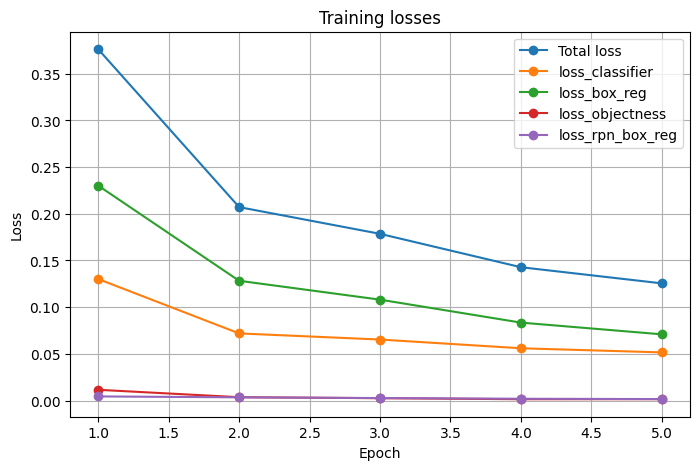

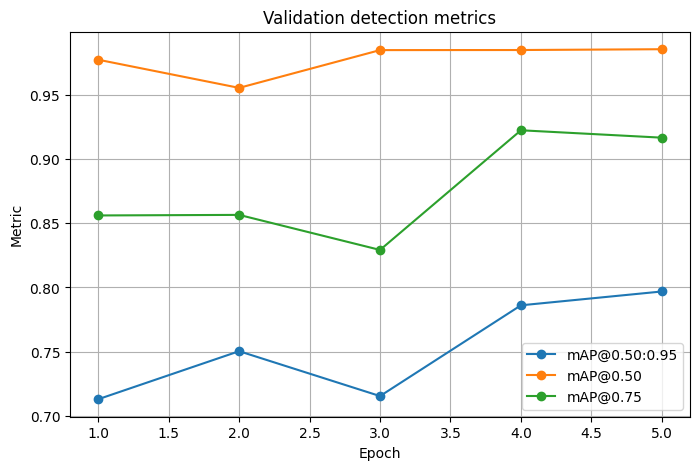

In [ ]:
epochs_axis = np.arange(
    1,
    len(history["train"]) + 1,
)

plt.figure(figsize=(8, 5))

plt.plot(
    epochs_axis,
    [
        item["total_loss"]
        for item in history["train"]
    ],
    marker="o",
    label="Total loss",
)

for loss_name in [
    "loss_classifier",
    "loss_box_reg",
    "loss_objectness",
    "loss_rpn_box_reg",
]:
    plt.plot(
        epochs_axis,
        [
            item[loss_name]
            for item in history["train"]
        ],
        marker="o",
        label=loss_name,
    )

plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training losses")
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(8, 5))

plt.plot(
    epochs_axis,
    [
        item["map"]
        for item in history["validation"]
    ],
    marker="o",
    label="mAP@0.50:0.95",
)

plt.plot(
    epochs_axis,
    [
        item["map_50"]
        for item in history["validation"]
    ],
    marker="o",
    label="mAP@0.50",
)

plt.plot(
    epochs_axis,
    [
        item["map_75"]
        for item in history["validation"]
    ],
    marker="o",
    label="mAP@0.75",
)

plt.xlabel("Epoch")
plt.ylabel("Metric")
plt.title("Validation detection metrics")
plt.legend()
plt.grid(True)
plt.show()

## Phần VII. Nạp best model và đánh giá cuối

PyTorch không có khái niệm model chưa `built` như subclassed Keras model.

Quy trình:

1. Tạo lại đúng kiến trúc.
2. Nạp `state_dict`.
3. Chuyển model lên device.
4. Gọi `eval()` trước inference.

`state_dict` chỉ chứa tensors của model nên gọn và dễ quản lý.

## 21. Nạp best weights

In [ ]:
best_model = create_faster_rcnn_model(
    NUM_CLASSES
)

try:
    best_state_dict = torch.load(
        BEST_WEIGHTS_PATH,
        map_location="cpu",
        weights_only=True,
    )
except TypeError:
    best_state_dict = torch.load(
        BEST_WEIGHTS_PATH,
        map_location="cpu",
    )

best_model.load_state_dict(
    best_state_dict
)

best_model = best_model.to(DEVICE)
best_model.eval()

print(
    "Đã nạp:",
    BEST_WEIGHTS_PATH,
)

Đã nạp: /content/faster_rcnn_pytorch/faster_rcnn_penn_fudan_best.pth


## 22. Báo cáo metrics cuối

In [ ]:
final_metrics = evaluate_map(
    model=best_model,
    data_loader=validation_loader,
    device=DEVICE,
)

metric_names = [
    "map",
    "map_50",
    "map_75",
    "map_small",
    "map_medium",
    "map_large",
    "mar_1",
    "mar_10",
    "mar_100",
    "map_per_class",
    "mar_100_per_class",
    "classes",
]

for name in metric_names:
    if name in final_metrics:
        print(
            f"{name:20s}:",
            metric_value(
                final_metrics,
                name,
            ),
        )

Validation:   0%|          | 0/34 [00:00<?, ?it/s]

map                 : 0.7968853712081909
map_50              : 0.9855126738548279
map_75              : 0.9166439175605774
map_small           : 0.5504950284957886
map_medium          : 0.6092644929885864
map_large           : 0.8239312171936035
mar_1               : 0.4123287796974182
mar_10              : 0.8424657583236694
mar_100             : 0.8424657583236694
map_per_class       : 0.7968853712081909
mar_100_per_class   : 0.8424657583236694
classes             : 1.0


## Phần VIII. Inference và trực quan hóa

Confidence threshold dùng khi hiển thị có thể khác `box_score_thresh` của model.

- `box_score_thresh=0.05` giữ nhiều candidates để đánh giá mAP.
- Visualization thường dùng 0.30–0.70 để hình dễ đọc.

## 23. Hàm prediction

In [ ]:
@torch.inference_mode()
def predict_image(
    model,
    image,
    device,
):
    model.eval()

    prediction = model(
        [image.to(device)]
    )[0]

    return {
        key: value.detach().cpu()
        for key, value in prediction.items()
    }


def visualize_prediction(
    image,
    prediction,
    score_threshold=0.50,
    title=None,
):
    keep = (
        prediction["scores"]
        >= score_threshold
    )

    boxes = prediction["boxes"][keep]
    scores = prediction["scores"][keep]
    labels_tensor = (
        prediction["labels"][keep]
    )

    labels = [
        (
            f"pedestrian: {score:.2f}"
            if int(class_id) == 1
            else f"class {int(class_id)}: {score:.2f}"
        )
        for class_id, score in zip(
            labels_tensor,
            scores,
        )
    ]

    image_uint8 = image_to_uint8(image)

    drawn = draw_bounding_boxes(
        image_uint8,
        boxes=boxes,
        labels=labels,
        width=3,
    )

    plt.figure(figsize=(8, 8))
    plt.imshow(
        drawn.permute(1, 2, 0)
    )
    plt.axis("off")

    if title:
        plt.title(title)

    plt.show()

    print(
        "Số detection:",
        len(boxes),
    )

## 24. Ground truth và prediction trên validation set

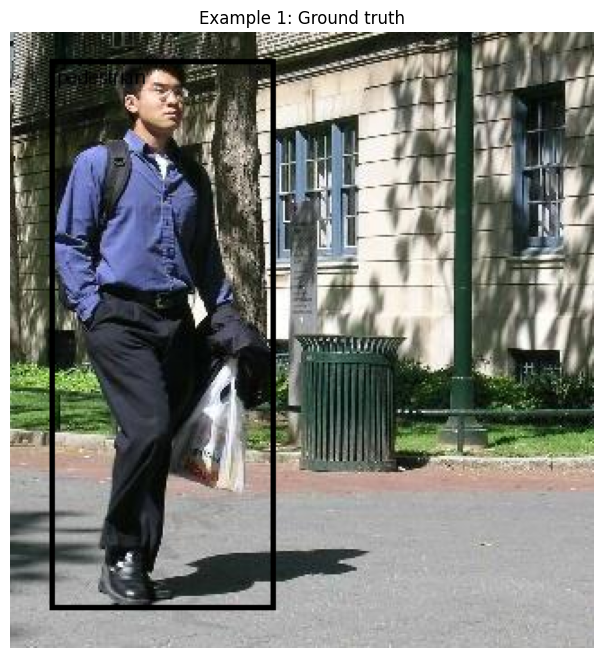

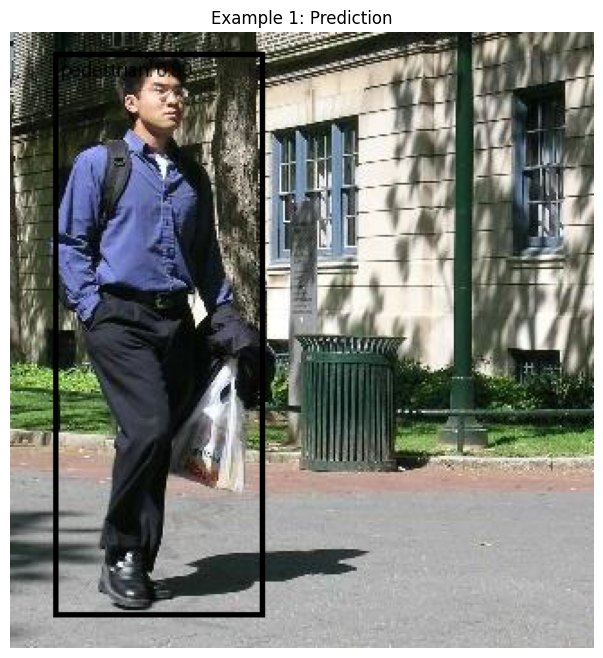

Số detection: 1


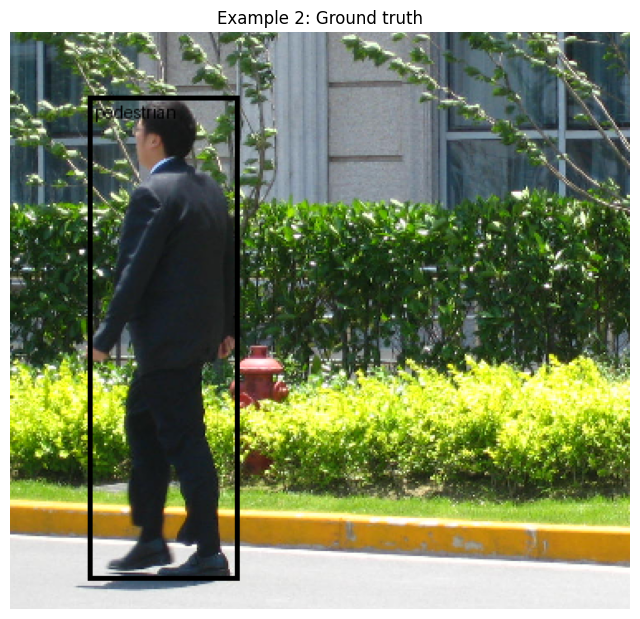

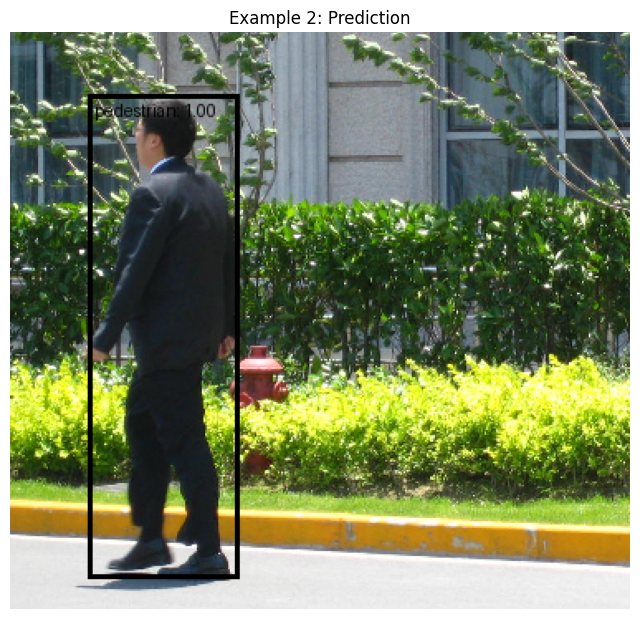

Số detection: 1


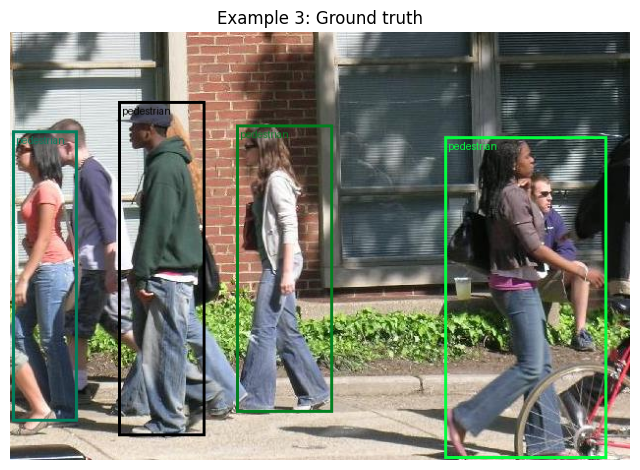

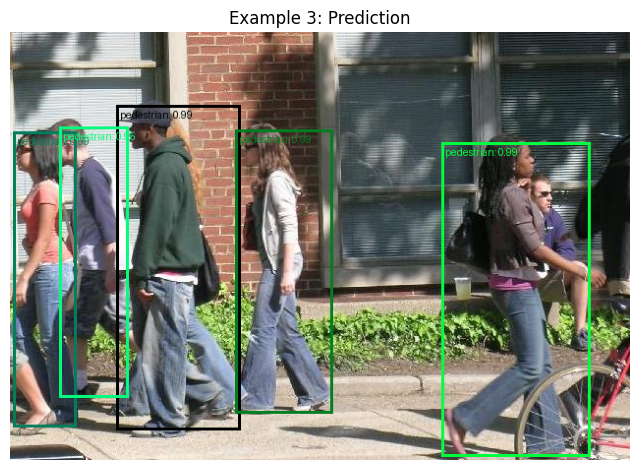

Số detection: 5


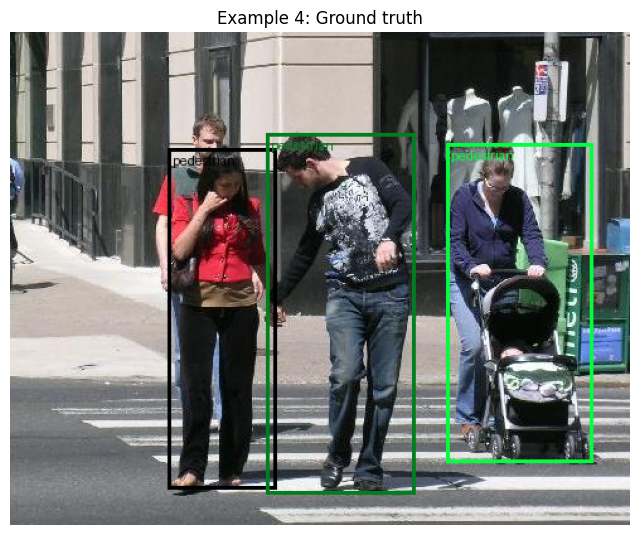

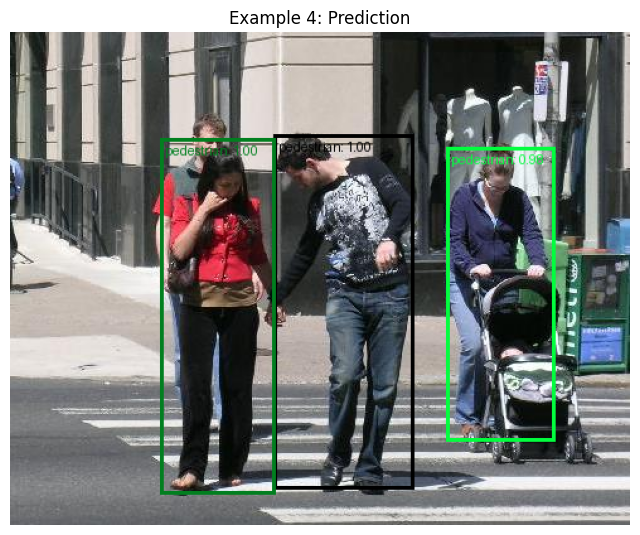

Số detection: 3


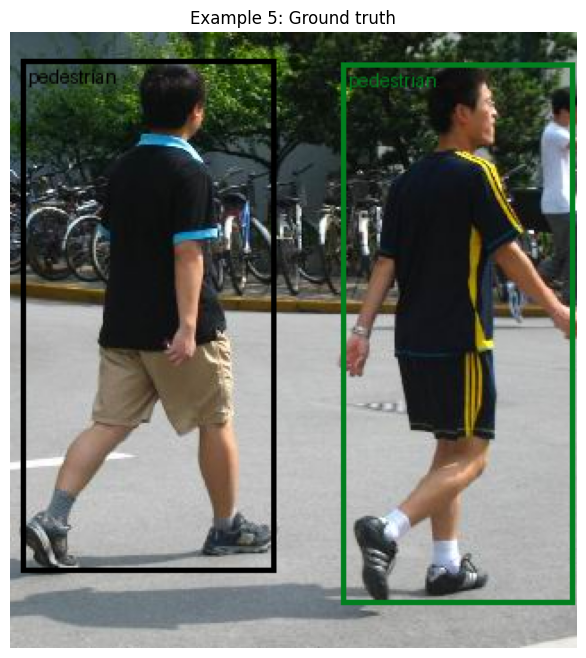

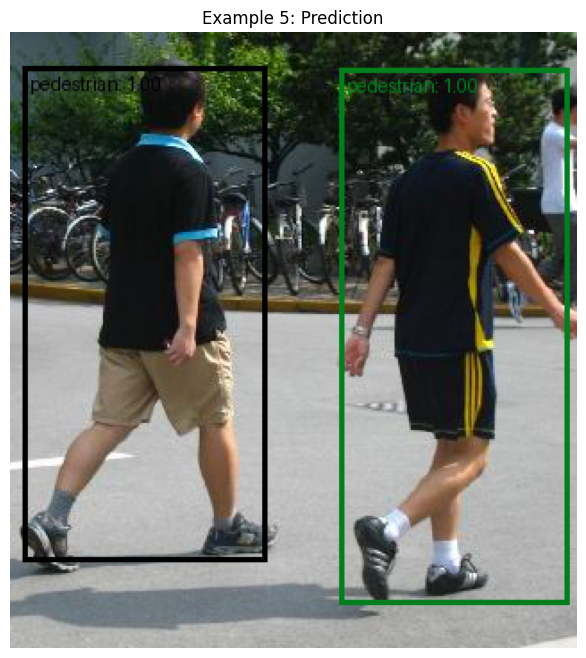

Số detection: 2


In [ ]:
number_of_examples = min(
    5,
    len(validation_dataset),
)

for example_index in range(
    number_of_examples
):
    image, target = (
        validation_dataset[example_index]
    )

    prediction = predict_image(
        model=best_model,
        image=image,
        device=DEVICE,
    )

    visualize_target(
        image,
        target,
        title=(
            f"Example {example_index + 1}: "
            "Ground truth"
        ),
    )

    visualize_prediction(
        image,
        prediction,
        score_threshold=0.50,
        title=(
            f"Example {example_index + 1}: "
            "Prediction"
        ),
    )

## 25. Ảnh hưởng của confidence threshold

Threshold thấp:

- Recall thường tăng.
- Có nhiều false positive và duplicate box hơn.

Threshold cao:

- Chỉ giữ prediction chắc chắn.
- Precision có thể tăng.
- Có thể bỏ sót object.

Không nên chọn threshold chỉ dựa trên ảnh đẹp nhất. Cần xem toàn validation set.

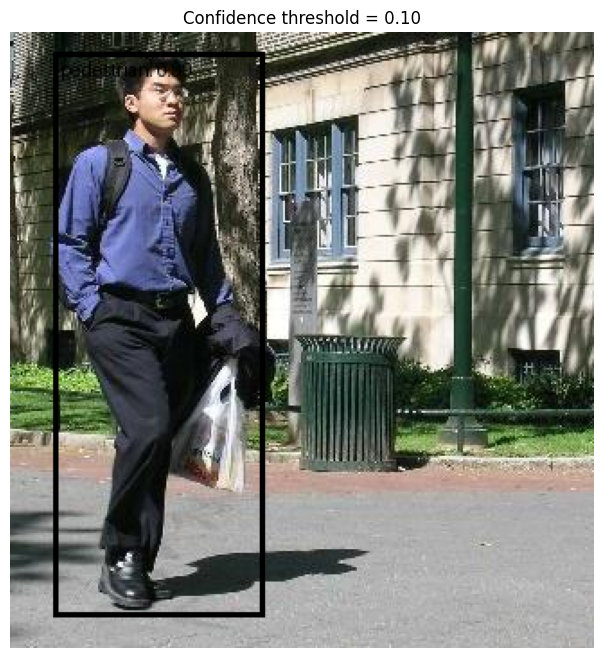

Số detection: 1


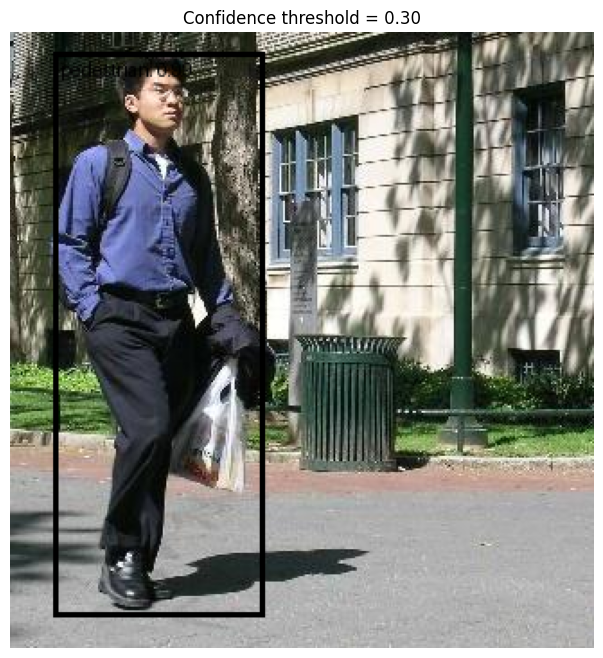

Số detection: 1


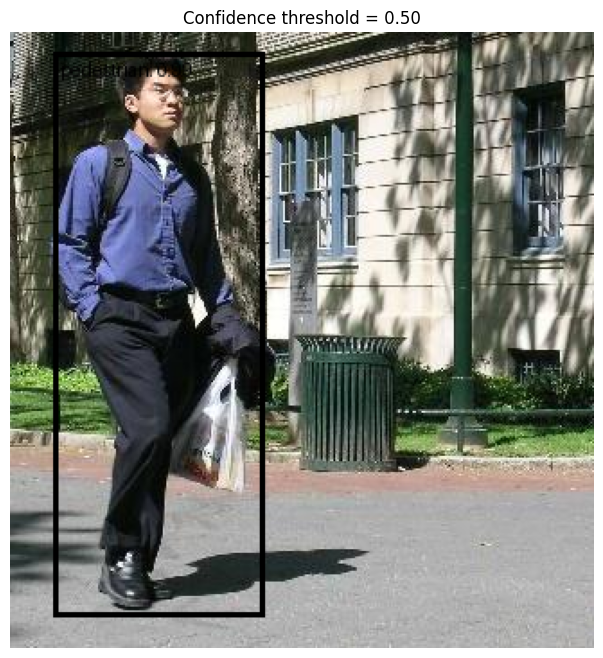

Số detection: 1


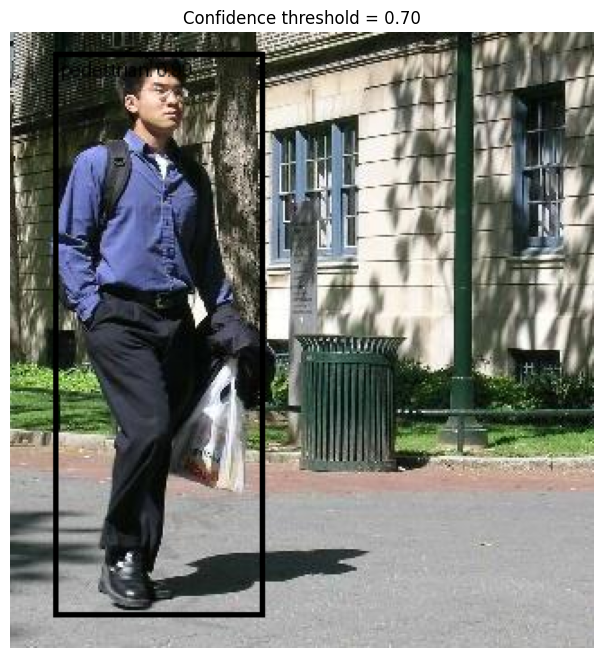

Số detection: 1


In [ ]:
image, target = validation_dataset[0]

prediction = predict_image(
    model=best_model,
    image=image,
    device=DEVICE,
)

for threshold in [
    0.10,
    0.30,
    0.50,
    0.70,
]:
    visualize_prediction(
        image,
        prediction,
        score_threshold=threshold,
        title=(
            "Confidence threshold = "
            f"{threshold:.2f}"
        ),
    )

## 26. Precision, Recall và F1 tại một threshold

mAP đánh giá qua nhiều score thresholds. Khi triển khai, ta thường chọn một
threshold cụ thể.

Cell dưới đây matching prediction với ground truth tại:

- Confidence threshold tùy chọn.
- IoU threshold = 0.50.
- Mỗi ground truth chỉ được ghép một lần.

In [1]:
def compute_detection_counts(
    prediction,
    target,
    score_threshold=0.50,
    iou_threshold=0.50,
):
    keep = (
        prediction["scores"]
        >= score_threshold
    )

    predicted_boxes = (
        prediction["boxes"][keep]
    )

    ground_truth_boxes = (
        target["boxes"]
        .as_subclass(torch.Tensor)
        .cpu()
    )

    matched_ground_truth = torch.zeros(
        len(ground_truth_boxes),
        dtype=torch.bool,
    )

    true_positives = 0
    false_positives = 0

    if (
        len(predicted_boxes) > 0
        and len(ground_truth_boxes) > 0
    ):
        iou_matrix = box_iou(
            predicted_boxes,
            ground_truth_boxes,
        )

        for prediction_index in range(
            len(predicted_boxes)
        ):
            best_iou, best_gt_index = (
                iou_matrix[
                    prediction_index
                ].max(dim=0)
            )

            if (
                best_iou >= iou_threshold
                and not matched_ground_truth[
                    best_gt_index
                ]
            ):
                true_positives += 1
                matched_ground_truth[
                    best_gt_index
                ] = True
            else:
                false_positives += 1

    else:
        false_positives = len(
            predicted_boxes
        )

    false_negatives = int(
        (~matched_ground_truth).sum()
    )

    return (
        true_positives,
        false_positives,
        false_negatives,
    )


@torch.inference_mode()
def evaluate_at_threshold(
    model,
    dataset,
    device,
    score_threshold=0.50,
    iou_threshold=0.50,
):
    total_tp = 0
    total_fp = 0
    total_fn = 0

    for index in tqdm(
        range(len(dataset)),
        desc="Threshold evaluation",
    ):
        image, target = dataset[index]

        prediction = predict_image(
            model,
            image,
            device,
        )

        tp, fp, fn = compute_detection_counts(
            prediction,
            target,
            score_threshold,
            iou_threshold,
        )

        total_tp += tp
        total_fp += fp
        total_fn += fn

    precision = total_tp / max(
        total_tp + total_fp,
        1,
    )

    recall = total_tp / max(
        total_tp + total_fn,
        1,
    )

    f1 = (
        2 * precision * recall
        / max(precision + recall, 1e-12)
    )

    return {
        "true_positives": total_tp,
        "false_positives": total_fp,
        "false_negatives": total_fn,
        "precision": precision,
        "recall": recall,
        "f1": f1,
    }


threshold_metrics = evaluate_at_threshold(
    model=best_model,
    dataset=validation_dataset,
    device=DEVICE,
    score_threshold=0.50,
    iou_threshold=0.50,
)

threshold_metrics

NameError: name 'torch' is not defined

## 27. Dự đoán ảnh tải lên Colab

Ảnh người dùng được:

1. Đọc bằng PIL.
2. Chuyển sang RGB.
3. Chuyển thành tensor float `[0,1]`.
4. Đưa vào model dưới dạng list một ảnh.

In [ ]:
from google.colab import files

uploaded_files = files.upload()

for filename, file_bytes in (
    uploaded_files.items()
):
    pil_image = PILImage.open(
        io.BytesIO(file_bytes)
    ).convert("RGB")

    image_tensor = TF.to_tensor(
        pil_image
    )

    prediction = predict_image(
        model=best_model,
        image=image_tensor,
        device=DEVICE,
    )

    visualize_prediction(
        image_tensor,
        prediction,
        score_threshold=0.50,
        title=filename,
    )

## 28. Đo thời gian inference

GPU cần warm-up vì lần chạy đầu bao gồm kernel initialization.

Latency phụ thuộc:

- Kích thước ảnh.
- Số proposals.
- GPU.
- Số detections.
- Mixed precision và compilation.

In [ ]:
@torch.inference_mode()
def benchmark_inference(
    model,
    image,
    device,
    warmup_runs=3,
    measured_runs=20,
):
    model.eval()

    image_on_device = image.to(device)

    for _ in range(warmup_runs):
        _ = model([image_on_device])

    if device.type == "cuda":
        torch.cuda.synchronize()

    start_time = time.perf_counter()

    for _ in range(measured_runs):
        _ = model([image_on_device])

    if device.type == "cuda":
        torch.cuda.synchronize()

    elapsed = (
        time.perf_counter() - start_time
    )

    average_seconds = (
        elapsed / measured_runs
    )

    return {
        "milliseconds_per_image": (
            average_seconds * 1000
        ),
        "frames_per_second": (
            1.0 / average_seconds
        ),
    }


benchmark_image, _ = validation_dataset[0]

benchmark_results = benchmark_inference(
    model=best_model,
    image=benchmark_image,
    device=DEVICE,
)

benchmark_results

## Phần IX. Lưu checkpoint đầy đủ tùy chọn

Best model ở trên chỉ lưu `model.state_dict()`.

Để tiếp tục training chính xác, có thể lưu thêm:

- Optimizer state.
- Scheduler state.
- Scaler state.
- Epoch.
- Best metric.
- Hyperparameters.

In [ ]:
FULL_CHECKPOINT_PATH = (
    OUTPUT_DIR
    / "faster_rcnn_training_checkpoint.pth"
)

full_checkpoint = {
    "epoch": EPOCHS,
    "model_state_dict": (
        model.state_dict()
    ),
    "optimizer_state_dict": (
        optimizer.state_dict()
    ),
    "scheduler_state_dict": (
        scheduler.state_dict()
    ),
    "scaler_state_dict": (
        scaler.state_dict()
    ),
    "best_map_50": best_map_50,
    "config": {
        "num_classes": NUM_CLASSES,
        "batch_size": BATCH_SIZE,
        "learning_rate": LEARNING_RATE,
        "momentum": MOMENTUM,
        "weight_decay": WEIGHT_DECAY,
        "min_size": MIN_SIZE,
        "max_size": MAX_SIZE,
    },
}

torch.save(
    full_checkpoint,
    FULL_CHECKPOINT_PATH,
)

print(
    "Đã lưu full checkpoint:",
    FULL_CHECKPOINT_PATH,
)

## 29. Tiếp tục training từ checkpoint

Khi resume:

1. Tạo đúng kiến trúc.
2. Tạo optimizer và scheduler.
3. Nạp state cho từng thành phần.
4. Tiếp tục từ `epoch + 1`.

> Với các checkpoint tự tạo và đáng tin cậy, có thể cần
> `weights_only=False` trên các phiên bản PyTorch mới khi dictionary chứa nhiều
> object ngoài tensors.

In [ ]:
# Ví dụ minh họa, không cần chạy nếu không resume.

# resumed_model = create_faster_rcnn_model(
#     NUM_CLASSES
# ).to(DEVICE)
#
# resumed_optimizer = torch.optim.SGD(
#     [
#         parameter
#         for parameter in resumed_model.parameters()
#         if parameter.requires_grad
#     ],
#     lr=LEARNING_RATE,
#     momentum=MOMENTUM,
#     weight_decay=WEIGHT_DECAY,
# )
#
# resumed_scheduler = (
#     torch.optim.lr_scheduler.StepLR(
#         resumed_optimizer,
#         step_size=3,
#         gamma=0.1,
#     )
# )
#
# try:
#     checkpoint = torch.load(
#         FULL_CHECKPOINT_PATH,
#         map_location=DEVICE,
#         weights_only=False,
#     )
# except TypeError:
#     checkpoint = torch.load(
#         FULL_CHECKPOINT_PATH,
#         map_location=DEVICE,
#     )
#
# resumed_model.load_state_dict(
#     checkpoint["model_state_dict"]
# )
#
# resumed_optimizer.load_state_dict(
#     checkpoint["optimizer_state_dict"]
# )
#
# resumed_scheduler.load_state_dict(
#     checkpoint["scheduler_state_dict"]
# )
#
# start_epoch = checkpoint["epoch"] + 1
#
# print("Resume from epoch:", start_epoch)

## Phần X. Phân tích siêu tham số

### 1. Image size

| Cấu hình | Ưu điểm | Nhược điểm |
|---|---|---|
| 320–480 | Nhanh, ít VRAM | Dễ bỏ sót pedestrian nhỏ |
| 512–768 | Cân bằng | Chậm hơn |
| 800–1333 | Gần recipe COCO | Tốn nhiều VRAM |

### 2. Trainable backbone layers

| Giá trị | Ý nghĩa |
|---:|---|
| 0 | Chỉ train FPN/RPN/ROI heads |
| 1–2 | Fine-tune phần sâu nhất |
| 3 | Transfer learning cân bằng |
| 5 | Fine-tune toàn backbone |

Dataset nhỏ có nguy cơ overfitting nếu mở toàn bộ backbone.

### 3. Learning rate

- Quá cao: loss dao động, NaN hoặc phá pretrained features.
- Quá thấp: hội tụ chậm.
- Khi batch size giảm từ 2 xuống 1, có thể thử giảm learning rate.

### 4. Proposal counts

- Tăng proposals có thể tăng RPN recall.
- ROI Align và second-stage head sẽ chậm hơn.
- Dataset có ít object mỗi ảnh nên tutorial giảm proposal counts.

### 5. Score threshold

- Đánh giá mAP cần giữ score threshold thấp.
- Triển khai có thể dùng threshold cao hơn.

### 6. NMS threshold

- Thấp: giảm duplicates.
- Cao: giữ object đứng gần nhau tốt hơn.

## Phần XI. Xử lý lỗi thường gặp

### CUDA out of memory

```python
BATCH_SIZE = 1
MIN_SIZE = 384
MAX_SIZE = 640
```

Sau lỗi:

```python
torch.cuda.empty_cache()
```

### `Expected input images to be of floating type`

Ảnh chưa được chuyển từ `uint8` sang float `[0,1]`.

Đảm bảo transform có:

```python
T.ToDtype(torch.float32, scale=True)
```

### `All bounding boxes should have positive height and width`

Kiểm tra:

```python
xmax > xmin
ymax > ymin
```

Dataset đã loại degenerate boxes bằng `valid`.

### Loss bằng NaN

- Giảm learning rate.
- Kiểm tra box.
- Kiểm tra label không có 0.
- Tắt augmentation để debug.
- Tạm tắt AMP.
- In từng thành phần loss.

### mAP bằng 0

- Huấn luyện thêm epoch.
- Kiểm tra visualization của ground truth.
- Giảm display threshold.
- Kiểm tra `NUM_CLASSES = 2`.
- Kiểm tra predictor đã được thay.
- Kiểm tra validation split không dùng random flip.

### DataLoader bị treo

Trên một số runtime, đặt:

```python
NUM_WORKERS = 0
```

### `pycocotools` chưa cài

```python
%pip install pycocotools
```

## Phần XII. Bài tập mở rộng

1. So sánh `MIN_SIZE` 384, 512 và 800.
2. So sánh batch size 1 và 2.
3. So sánh `TRAINABLE_BACKBONE_LAYERS` 0, 3 và 5.
4. Thay SGD bằng AdamW.
5. So sánh StepLR với CosineAnnealingLR.
6. Thử RPN proposal counts 100, 300 và 1000.
7. Thử NMS threshold 0.3, 0.5 và 0.7.
8. Vẽ Precision–Recall curve tại IoU 0.50.
9. Chạy nhiều random seeds và báo cáo mean ± standard deviation.
10. So sánh với `fasterrcnn_resnet50_fpn_v2`.
11. So sánh với `fasterrcnn_mobilenet_v3_large_fpn`.
12. So sánh Faster R-CNN và YOLO trên cùng split.
13. Thay Penn–Fudan bằng dataset nhiều lớp.
14. Thêm random photometric augmentation.
15. Export model sang ONNX với fixed input size.

## Kết luận

Tutorial đã sử dụng Faster R-CNN có sẵn trong torchvision. Phần người dùng cần
tự xây dựng chủ yếu là:

- Dataset.
- Transform.
- Training loop.
- Evaluation.
- Checkpoint và inference.

Backbone, FPN, anchor generator, RPN, proposal matching, ROI Align, ROI Head,
loss và NMS đều do torchvision cung cấp.